# Weekly Project 2!

## Introduction to Road Traffic Accidents (RTA) Dataset

### Dataset Overview
The RTA Dataset provides a detailed snapshot of road traffic accidents, capturing a range of data from accident conditions to casualty details. This dataset is essential for analyzing patterns and causes of accidents to improve road safety.

### Data Characteristics
- **Entries**: The dataset contains 12,316 entries.
- **Features**: There are 32 features in the dataset, which include:
  - `Time`: Time when the accident occurred.
  - `Day_of_week`: Day of the week.
  - `Age_band_of_driver`: Age group of the driver involved.
  - `Sex_of_driver`: Gender of the driver.
  - `Educational_level`: Educational level of the driver.
  - `Type_of_vehicle`: Type of vehicle involved in the accident.
  - `Cause_of_accident`: Reported cause of the accident.
  - `Accident_severity`: Severity of the accident.
- **Target Column**: `Accident_severity` is used as the target column for modeling. This feature classifies the severity of each accident.

### Objective
Students will use this dataset to apply various data visualization, modeling, and evaluation techniques learned in class. The primary goal is to build models that can accurately predict the severity of accidents and to identify the key factors that contribute to severe accidents.

## Import Libraries
Import all the necessary libraries here. Include libraries for handling data (like pandas), visualization (like matplotlib and seaborn), and modeling (like scikit-learn).

In [109]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

## Load Data
Load the dataset from the provided CSV file into a DataFrame.

In [110]:
df = pd.read_csv("C:\\Users\\abdau\\Downloads\\RTA_Dataset.csv")

  ## Exploratory Data Analysis (EDA)
Perform EDA to understand the data better. This involves several steps to summarize the main characteristics, uncover patterns, and establish relationships:
* Find the dataset information and observe the datatypes.
* Check the shape of the data to understand its structure.
* View the the data with various functions to get an initial sense of the data.
* Perform summary statistics on the dataset to grasp central tendencies and variability.
* Check for duplicated data.
* Check for null values.

And apply more if needed!


In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Time                         12316 non-null  object
 1   Day_of_week                  12316 non-null  object
 2   Age_band_of_driver           12316 non-null  object
 3   Sex_of_driver                12316 non-null  object
 4   Educational_level            11575 non-null  object
 5   Vehicle_driver_relation      11737 non-null  object
 6   Driving_experience           11487 non-null  object
 7   Type_of_vehicle              11366 non-null  object
 8   Owner_of_vehicle             11834 non-null  object
 9   Service_year_of_vehicle      8388 non-null   object
 10  Defect_of_vehicle            7889 non-null   object
 11  Area_accident_occured        12077 non-null  object
 12  Lanes_or_Medians             11931 non-null  object
 13  Road_allignment              12

In [112]:
df.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury


In [113]:
df.isnull().sum()

Time                              0
Day_of_week                       0
Age_band_of_driver                0
Sex_of_driver                     0
Educational_level               741
Vehicle_driver_relation         579
Driving_experience              829
Type_of_vehicle                 950
Owner_of_vehicle                482
Service_year_of_vehicle        3928
Defect_of_vehicle              4427
Area_accident_occured           239
Lanes_or_Medians                385
Road_allignment                 142
Types_of_Junction               887
Road_surface_type               172
Road_surface_conditions           0
Light_conditions                  0
Weather_conditions                0
Type_of_collision               155
Number_of_vehicles_involved       0
Number_of_casualties              0
Vehicle_movement                308
Casualty_class                    0
Sex_of_casualty                   0
Age_band_of_casualty              0
Casualty_severity                 0
Work_of_casuality           

In [114]:
df

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,16:15:00,Wednesday,31-50,Male,NaN,Employee,2-5yr,Lorry (11?40Q),Owner,NaN,...,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12312,18:00:00,Sunday,Unknown,Male,Elementary school,Employee,5-10yr,Automobile,Owner,NaN,...,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12313,13:55:00,Sunday,Over 51,Male,Junior high school,Employee,5-10yr,Bajaj,Owner,2-5yrs,...,Other,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Serious Injury
12314,13:55:00,Sunday,18-30,Female,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,2-5yrs,...,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,Driving under the influence of drugs,Slight Injury


In [115]:
print("Unique values before processing:")
for column in df.columns:
    print(f"{column}: {df[column].unique()}")

for column in df.columns:
    df[column] = df[column].replace('na', np.nan)
    
    if df[column].isnull().sum() > 0: 
        most_frequent = df[column].mode()[0]
        df[column] = df[column].fillna(most_frequent)

print("\nUnique values after processing and filling missing values:")
for column in df.columns:
    print(f"{column}: {df[column].unique()}")

print("\nDataFrame after filling missing values:")
print(df)


Unique values before processing:
Time: ['17:02:00' '1:06:00' '14:15:00' ... '7:24:00' '19:18:00' '2:47:00']
Day_of_week: ['Monday' 'Sunday' 'Friday' 'Wednesday' 'Saturday' 'Thursday' 'Tuesday']
Age_band_of_driver: ['18-30' '31-50' 'Under 18' 'Over 51' 'Unknown']
Sex_of_driver: ['Male' 'Female' 'Unknown']
Educational_level: ['Above high school' 'Junior high school' nan 'Elementary school'
 'High school' 'Unknown' 'Illiterate' 'Writing & reading']
Vehicle_driver_relation: ['Employee' 'Unknown' 'Owner' nan 'Other']
Driving_experience: ['1-2yr' 'Above 10yr' '5-10yr' '2-5yr' nan 'No Licence' 'Below 1yr'
 'unknown']
Type_of_vehicle: ['Automobile' 'Public (> 45 seats)' 'Lorry (41?100Q)' nan
 'Public (13?45 seats)' 'Lorry (11?40Q)' 'Long lorry' 'Public (12 seats)'
 'Taxi' 'Pick up upto 10Q' 'Stationwagen' 'Ridden horse' 'Other' 'Bajaj'
 'Turbo' 'Motorcycle' 'Special vehicle' 'Bicycle']
Owner_of_vehicle: ['Owner' 'Governmental' nan 'Organization' 'Other']
Service_year_of_vehicle: ['Above 10yr' 

In [116]:
df

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,Driver or rider,Male,18-30,3,Driver,Normal,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,Driver or rider,Male,18-30,3,Driver,Normal,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,Unknown,...,Going straight,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,Unknown,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Owner,5-10yrs,...,Going straight,Driver or rider,Male,18-30,3,Driver,Normal,Not a Pedestrian,Overtaking,Slight Injury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,16:15:00,Wednesday,31-50,Male,Junior high school,Employee,2-5yr,Lorry (11?40Q),Owner,Unknown,...,Going straight,Driver or rider,Male,18-30,3,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12312,18:00:00,Sunday,Unknown,Male,Elementary school,Employee,5-10yr,Automobile,Owner,Unknown,...,Other,Driver or rider,Male,18-30,3,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12313,13:55:00,Sunday,Over 51,Male,Junior high school,Employee,5-10yr,Bajaj,Owner,2-5yrs,...,Other,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Serious Injury
12314,13:55:00,Sunday,18-30,Female,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,2-5yrs,...,Other,Driver or rider,Male,18-30,3,Driver,Normal,Not a Pedestrian,Driving under the influence of drugs,Slight Injury


In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Time                         12316 non-null  object
 1   Day_of_week                  12316 non-null  object
 2   Age_band_of_driver           12316 non-null  object
 3   Sex_of_driver                12316 non-null  object
 4   Educational_level            12316 non-null  object
 5   Vehicle_driver_relation      12316 non-null  object
 6   Driving_experience           12316 non-null  object
 7   Type_of_vehicle              12316 non-null  object
 8   Owner_of_vehicle             12316 non-null  object
 9   Service_year_of_vehicle      12316 non-null  object
 10  Defect_of_vehicle            12316 non-null  object
 11  Area_accident_occured        12316 non-null  object
 12  Lanes_or_Medians             12316 non-null  object
 13  Road_allignment              12

In [118]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for column in df.columns:
    df[column] = label_encoder.fit_transform(df[column])

print(df)

       Time  Day_of_week  Age_band_of_driver  Sex_of_driver  \
0       420            1                   0              1   
1       420            1                   1              1   
2       420            1                   0              1   
3       594            3                   0              1   
4       594            3                   0              1   
...     ...          ...                 ...            ...   
12311   374            6                   1              1   
12312   476            3                   4              1   
12313   246            3                   2              1   
12314   246            3                   0              0   
12315   246            3                   0              1   

       Educational_level  Vehicle_driver_relation  Driving_experience  \
0                      0                        0                   0   
1                      4                        0                   3   
2                      4

In [119]:
df

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,420,1,0,1,0,0,0,0,3,3,...,2,0,1,0,2,0,2,5,9,2
1,420,1,1,1,4,0,3,11,3,2,...,2,0,1,0,2,0,2,5,16,2
2,420,1,0,1,4,0,0,5,3,5,...,2,0,1,1,2,0,2,5,0,1
3,594,3,0,1,4,0,2,11,0,5,...,2,2,0,0,2,0,2,5,1,2
4,594,3,0,1,4,0,1,0,3,2,...,2,0,1,0,2,0,2,5,16,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,374,6,1,1,4,0,1,4,3,5,...,2,0,1,0,2,0,2,5,10,2
12312,476,3,4,1,1,0,2,0,3,5,...,4,0,1,0,2,0,2,5,10,2
12313,246,3,2,1,4,0,2,1,3,1,...,4,0,1,1,2,0,2,5,1,1
12314,246,3,0,0,4,0,3,5,3,1,...,4,0,1,0,2,0,2,5,5,2


## Data Visualization
Create various plots to visualize the relationships in the data. Consider using the following to show different aspects of the data:

* Heatmap of Correlation Matrix.
* Line plots.
* Scatter plots.
* Histograms.
* Boxplots.

Use more if needed!

In [120]:
df.dtypes

Time                           int32
Day_of_week                    int32
Age_band_of_driver             int32
Sex_of_driver                  int32
Educational_level              int32
Vehicle_driver_relation        int32
Driving_experience             int32
Type_of_vehicle                int32
Owner_of_vehicle               int32
Service_year_of_vehicle        int32
Defect_of_vehicle              int32
Area_accident_occured          int32
Lanes_or_Medians               int32
Road_allignment                int32
Types_of_Junction              int32
Road_surface_type              int32
Road_surface_conditions        int32
Light_conditions               int32
Weather_conditions             int32
Type_of_collision              int32
Number_of_vehicles_involved    int64
Number_of_casualties           int64
Vehicle_movement               int32
Casualty_class                 int32
Sex_of_casualty                int32
Age_band_of_casualty           int32
Casualty_severity              int32
W

In [121]:
#Correlation Matrix
corr_matrix = df.corr()
print(corr_matrix)

                                 Time  Day_of_week  Age_band_of_driver  \
Time                         1.000000     0.019232           -0.012789   
Day_of_week                  0.019232     1.000000            0.019993   
Age_band_of_driver          -0.012789     0.019993            1.000000   
Sex_of_driver               -0.021671     0.009986           -0.351878   
Educational_level           -0.022084    -0.004517            0.013613   
Vehicle_driver_relation      0.008455     0.003303           -0.005841   
Driving_experience          -0.011945    -0.010062           -0.013407   
Type_of_vehicle              0.009621    -0.002417            0.004830   
Owner_of_vehicle            -0.007531     0.001417            0.005405   
Service_year_of_vehicle     -0.002328    -0.022951            0.000220   
Defect_of_vehicle           -0.009904    -0.005889           -0.018992   
Area_accident_occured       -0.023034     0.003281            0.011472   
Lanes_or_Medians             0.000216 

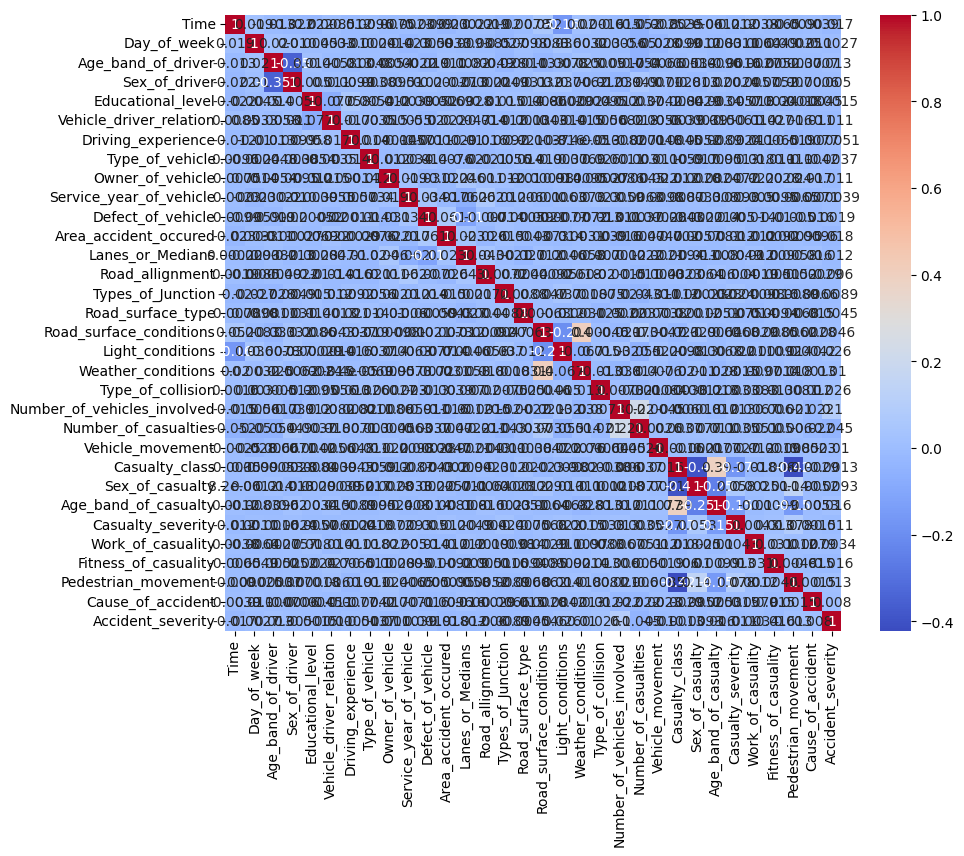

In [122]:
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', square=True)
plt.show()


<Axes: xlabel='Age_band_of_casualty', ylabel='Cause_of_accident'>

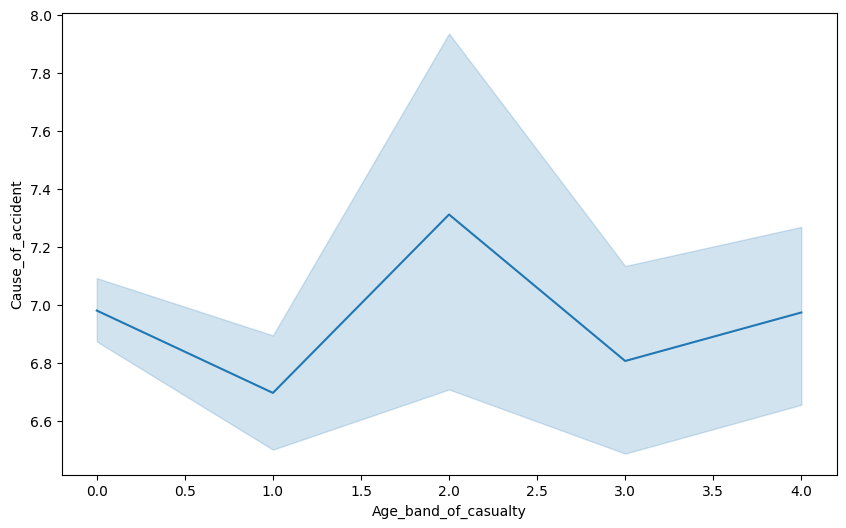

In [123]:
# cheack the attrition rate by age with line plot

plt.figure(figsize=[10,6])
sns.lineplot(x='Age_band_of_casualty', y='Cause_of_accident', data=df)


In [124]:
import plotly.express as px

grouped_data = df.groupby('Time').agg(
    Sex_of_driver=("Sex_of_driver", "max"),
    Vehicle_driver_relation=("Vehicle_driver_relation", "max"),
    Type_of_vehicle=("Type_of_vehicle", "max")
).reset_index()

# عرض البيانات المجموعة
print(grouped_data)

# رسم البيانات
fig = px.scatter(grouped_data, 
                 x='Sex_of_driver', 
                 y='Vehicle_driver_relation', 
                 size='Type_of_vehicle', 
                 color='Time',
                 title='Vehicle Driver Relation by Time and Type of Vehicle',
                 labels={'Sex_of_driver': 'Sex of Driver', 'Vehicle_driver_relation': 'Vehicle Driver Relation', 'Type_of_vehicle': 'Type of Vehicle'},
                 hover_name='Time')

fig.show()

      Time  Sex_of_driver  Vehicle_driver_relation  Type_of_vehicle
0        0              1                        0               14
1        1              1                        0                8
2        2              1                        0                5
3        3              1                        0                8
4        4              1                        0                7
...    ...            ...                      ...              ...
1069  1069              1                        2               14
1070  1070              1                        0                0
1071  1071              1                        2               14
1072  1072              1                        1                5
1073  1073              1                        0               10

[1074 rows x 4 columns]


array([[<Axes: title={'center': 'Time'}>,
        <Axes: title={'center': 'Day_of_week'}>,
        <Axes: title={'center': 'Age_band_of_driver'}>,
        <Axes: title={'center': 'Sex_of_driver'}>,
        <Axes: title={'center': 'Educational_level'}>,
        <Axes: title={'center': 'Vehicle_driver_relation'}>],
       [<Axes: title={'center': 'Driving_experience'}>,
        <Axes: title={'center': 'Type_of_vehicle'}>,
        <Axes: title={'center': 'Owner_of_vehicle'}>,
        <Axes: title={'center': 'Service_year_of_vehicle'}>,
        <Axes: title={'center': 'Defect_of_vehicle'}>,
        <Axes: title={'center': 'Area_accident_occured'}>],
       [<Axes: title={'center': 'Lanes_or_Medians'}>,
        <Axes: title={'center': 'Road_allignment'}>,
        <Axes: title={'center': 'Types_of_Junction'}>,
        <Axes: title={'center': 'Road_surface_type'}>,
        <Axes: title={'center': 'Road_surface_conditions'}>,
        <Axes: title={'center': 'Light_conditions'}>],
       [<Axes

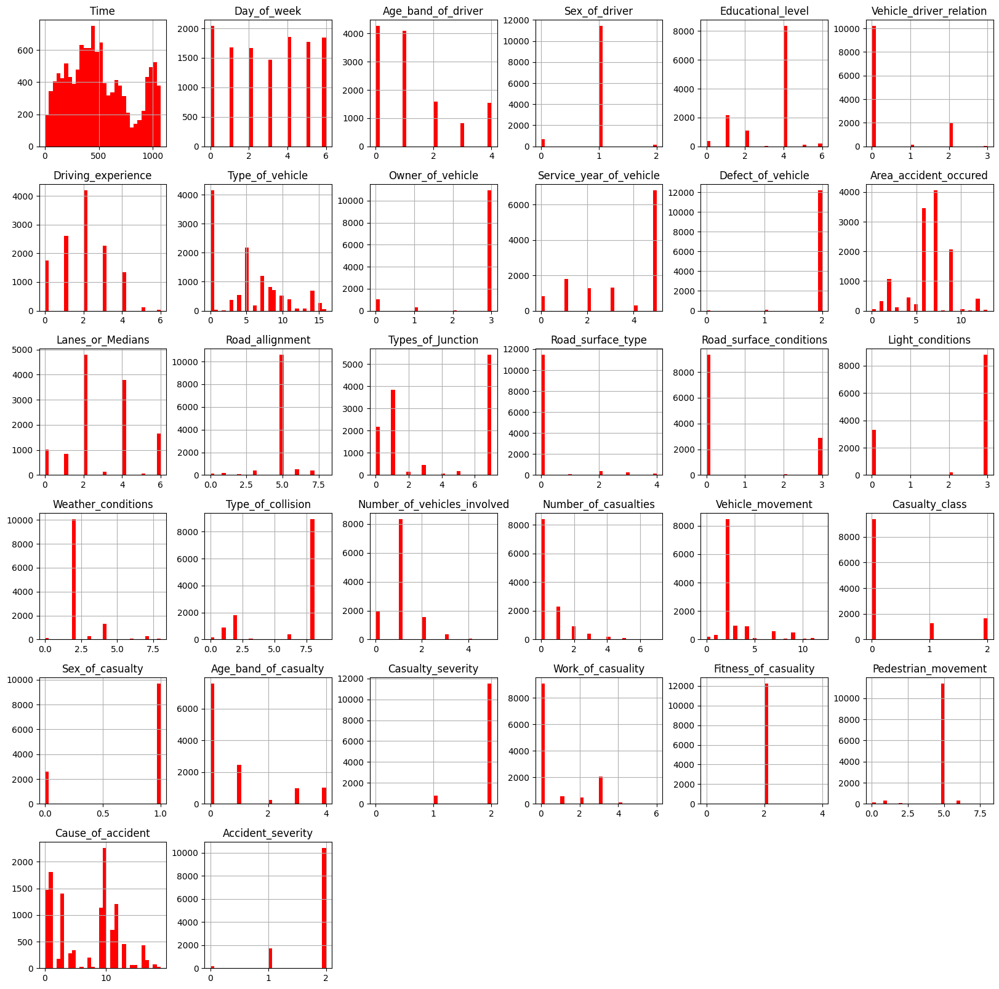

In [125]:
df.hist(bins=30, figsize=(20,20), color='r')


In [126]:
sns.pairplot(df, hue='Accident_severity')

## Data Preprocessing
Data preprocessing is essential for transforming raw data into a format suitable for further analysis and modeling. Follow these steps to ensure your data is ready for predictive modeling or advanced analytics:
- **Handling Missing Values**: Replace missing values with appropriate statistics (mean, median, mode) or use more complex imputation techniques.
- **Normalization/Scaling**: Scale data to a small, specified range like 0 to 1, or transform it to have a mean of zero and a standard deviation of one.
- **Label Encoding**: Convert categorical text data into model-understandable numbers where the labels are ordered.
- **One-Hot Encoding**: Use for nominal categorical data where no ordinal relationship exists to transform the data into a binary column for each category. (Be careful not to increase the dimensionality significantly)
- **Detection and Treatment of Outliers**: Use statistical tests, box plots, or scatter plots to identify outliers and then cap, trim, or use robust methods to reduce the effect of outliers, depending on the context.
- **Feature Engineering**: Enhance your dataset by creating new features and transforming existing ones. This might involve combining data from different columns, applying transformations, or reducing dimensionality with techniques like PCA to improve model performance.

Consider these steps as a foundation, and feel free to introduce additional preprocessing techniques as needed to address specific characteristics of your dataset.

In [127]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

print("Statistics before removing outliers:")
print(df['Accident_severity'].describe())

df_cleaned = remove_outliers(df, 'Accident_severity')

print("\nStatistics after removing outliers:")
print(df_cleaned['Accident_severity'].describe())

df_cleaned.head()

Statistics before removing outliers:
count    12316.000000
mean         1.832819
std          0.406082
min          0.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          2.000000
Name: Accident_severity, dtype: float64

Statistics after removing outliers:
count    10415.0
mean         2.0
std          0.0
min          2.0
25%          2.0
50%          2.0
75%          2.0
max          2.0
Name: Accident_severity, dtype: float64


,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,420,1,0,1,0,0,0,0,3,3,...,2,0,1,0,2,0,2,5,9,2
1,420,1,1,1,4,0,3,11,3,2,...,2,0,1,0,2,0,2,5,16,2
3,594,3,0,1,4,0,2,11,0,5,...,2,2,0,0,2,0,2,5,1,2
4,594,3,0,1,4,0,1,0,3,2,...,2,0,1,0,2,0,2,5,16,2
5,265,0,1,1,4,3,2,0,3,5,...,10,0,1,1,2,0,2,5,14,2


## Feature Selection
- Choose features that you believe will most influence the outcome based on your analysis and the insights from your visualizations. Focus on those that appear most impactful to include in your modeling.

## Train-Test Split
* Divide the dataset into training and testing sets to evaluate the performance of your models.

## Modeling

Once the data is split into training and testing sets, the next step is to build models to make predictions. Here, we will explore several machine learning algorithms, each with its unique characteristics and suitability for different types of data and problems. You will implement the following models:

### 1. Logistic Regression

### 2. Decision Tree Classifier

### 3. Support Vector Machine (SVM)

### 4. K-Neighbors Classifier

### Implementing the Models
- For each model, use the training data you have prepared to train the model.

In [128]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


In [129]:
numerical_cols = ['Number_of_vehicles_involved', 'Number_of_casualties']
categorical_cols = ['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Type_of_vehicle', 'Owner_of_vehicle', 'Area_accident_occured']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_cols)
    ])

X = df.drop('Accident_severity', axis=1)
y = df['Accident_severity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [130]:
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', LogisticRegression(max_iter=1000))])
pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Number_of_vehicles_involved',
                                                   'Number_of_casualties']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['Day_of_week',
                                                   'Age_band_of_driver',
                                                   'Sex_of_driver',
                                                   'Educational_level',
                                                   'Vehicle_driver_relation',
                                                   'Driving_experience',
                                                   'Type_of_vehicle',
                                                   'Owner_of_vehicle',
                                                   'Area_accident_occured'])])),
                ('classifier', LogisticRegression(max_iter=1000))])

#### Logistic Regression

In [131]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
cv_scores = cross_val_score(pipeline,X_train,y_train, cv=5)
cv_scores_percent = cv_scores*100
print('cv_scores:',cv_scores_percent)
print('cv_scores:Mean',cv_scores_percent.mean())
pipeline.fit(X_train,y_train)
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred) * 100
print('Accuracy: ',accuracy)
print('Classification Report:\n',classification_report(y_test,y_pred))

cv_scores: [84.77929985 84.72856418 84.7715736  84.7715736  84.7715736 ]
cv_scores:Mean 84.76451696811894
Accuracy:  83.72564935064936
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.00      0.00      0.00       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.28      0.33      0.30      2464
weighted avg       0.70      0.84      0.76      2464



C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



#### Decision Tree Classifier

In [132]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
tree_model = DecisionTreeClassifier(random_state=42)
tree_model.fit(X_train, y_train)
y_pred = tree_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)*100
print('Accuracy: ',accuracy)
print('Classification Report: \n',classification_report(y_test ,y_pred))

Accuracy:  75.89285714285714
Classification Report: 
               precision    recall  f1-score   support

           0       0.29      0.35      0.32        37
           1       0.25      0.26      0.26       363
           2       0.86      0.85      0.86      2064

    accuracy                           0.76      2464
   macro avg       0.47      0.49      0.48      2464
weighted avg       0.76      0.76      0.76      2464



#### Support Vector Machine (SVM)

In [133]:
from sklearn.svm import SVC
svm_model =SVC(kernel='linear',random_state=42)
svm_model.fit(X_train,y_train)
y_pred= svm_model.predict(X_test)

accuracy = accuracy_score(y_test,y_pred)*100
print("Accuracy: " ,accuracy)
print('Classification Report:\n',classification_report(y_test,y_pred))


Accuracy:  83.76623376623377
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.00      0.00      0.00       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.28      0.33      0.30      2464
weighted avg       0.70      0.84      0.76      2464



C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



#### K-Neighbors Classifier

In [134]:
from sklearn.neighbors import KNeighborsClassifier
knn_model =KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train,y_train)
y_pred=knn_model.predict(X_test)
accuracy = accuracy_score(y_test,y_pred)*100
print('Accurcy:',accuracy)
print('Classification Report: \n', classification_report(y_test, y_pred))

Accurcy: 82.5487012987013
Classification Report: 
               precision    recall  f1-score   support

           0       0.25      0.03      0.05        37
           1       0.31      0.07      0.12       363
           2       0.85      0.97      0.90      2064

    accuracy                           0.83      2464
   macro avg       0.47      0.36      0.36      2464
weighted avg       0.76      0.83      0.78      2464



## Model Evaluation

After training your models, it's crucial to evaluate their performance to understand their effectiveness and limitations. This section outlines various techniques and metrics to assess the performance of each model you have implemented.

### Evaluation Techniques
1. **Confusion Matrix**

2. **Accuracy**

3. **Precision and Recall**

4. **F1 Score**

5. **ROC Curve and AUC**

### Implementing Evaluation
- Calculate the metrics listed above using your test data.

Accuracy:  0.8372564935064936
Precision:  0.27919880904046557
Recall:  0.333171834625323
F1 Score:  0.3038067888962521
Classification Report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.00      0.00      0.00       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.28      0.33      0.30      2464
weighted avg       0.70      0.84      0.76      2464



C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\abdau\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no pred

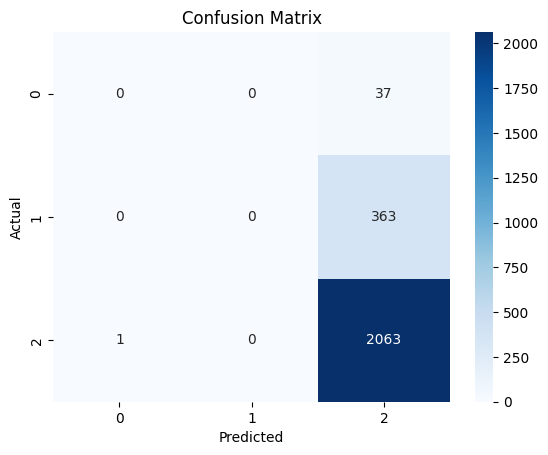

In [135]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# التنبؤ باستخدام مجموعة الاختبار
y_pred = pipeline.predict(X_test)

# تقييم النموذج
print('Accuracy: ', accuracy_score(y_test, y_pred))
print('Precision: ', precision_score(y_test, y_pred, average='macro'))
print('Recall: ', recall_score(y_test, y_pred, average='macro'))
print('F1 Score: ', f1_score(y_test, y_pred, average='macro'))
print('Classification Report: \n', classification_report(y_test, y_pred))

# مصفوفة الارتباك
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


## Project Questions:

### Comparative Analysis

- **Compare Metrics**: Examine the performance metrics (such as accuracy, precision, and recall) of each model. Document your observations on which model performs best for your dataset and the problem you're addressing.
- **Evaluate Trade-offs**: Discuss the trade-offs you encountered when choosing between models. Consider factors like computational efficiency, ease of implementation, and model interpretability.
- **Justify Your Choice**: After comparing and evaluating, explain why you believe one model is the best choice. Provide a clear rationale based on the performance metrics and trade-offs discussed.
- **Feature Importance**: Identify and discuss the most important features for the best-performing model. How do these features impact the predictions? Use the visualizations you have created to justify your answer if necessary.
- **Model Limitations**: Discuss any limitations you encountered with the models you used. Are there any aspects of the data or the problem that these models do not handle well?
- **Future Improvements**: Suggest potential improvements or further steps you could take to enhance model performance. This could include trying different algorithms, feature engineering techniques, or tuning hyperparameters.

### Answer Here:

In [136]:
importances = tree_model.feature_importances_
features = X_train.columns
important_features = pd.Series(importances, index=features).sort_values(ascending=False)
print(important_features)


Time                           0.177875
Day_of_week                    0.070771
Cause_of_accident              0.059065
Type_of_vehicle                0.058146
Driving_experience             0.049550
Area_accident_occured          0.047224
Number_of_vehicles_involved    0.045106
Types_of_Junction              0.044272
Vehicle_movement               0.036724
Service_year_of_vehicle        0.033749
Lanes_or_Medians               0.033452
Number_of_casualties           0.031817
Educational_level              0.030280
Type_of_collision              0.029468
Weather_conditions             0.028143
Age_band_of_driver             0.027941
Work_of_casuality              0.027030
Age_band_of_casualty           0.026546
Light_conditions               0.021424
Road_surface_conditions        0.015720
Road_surface_type              0.015264
Casualty_class                 0.012514
Road_allignment                0.011061
Pedestrian_movement            0.011000
Vehicle_driver_relation        0.010855


Model Limitations
Discuss any limitations encountered with the models:

Decision Tree: May overfit if not pruned properly.
SVM: Can be computationally intensive with large datasets.
KNN: May struggle with high-dimensional data due to the curse of dimensionality.
Future Improvements
Suggest potential improvements, such as:

Trying Different Algorithms: Exploring ensemble methods like Random Forest or Gradient Boosting.
Feature Engineering: Creating new features or performing dimensionality reduction.
Hyperparameter Tuning: Using GridSearchCV or RandomizedSearchCV to find the best parameters.
Cross-Validation: Implementing more robust cross-validation techniques to ensure model generalization.
By systematically comparing and evaluating the models, discussing their trade-offs, and justifying your final choice, you can provide a comprehensive analysis and rationale for the best model suited for your dataset and problem.